# Experiment 2.1.1
Combining the last two experiments into a single notebook, and making the results easy to compare. Also slimming down the notebook.

In [1]:
def high_pass_filter(img):
    """High-pass filter replicating Photoshops high-pass filter."""
    filter_sd = 200
    filter_size = (400, 400) 
    blurred = cv2.GaussianBlur(img,  filter_size, filter_sd, filter_sd)
    hp = 127.0 + (img - blurred)
    hp = np.clip(hp, 0, 255.0)
    return hp

Until section 4, all below text and code is duplicated from experiment 2.0.1.

## 1. Experiment improvements
This time, I make sure each input image contains an object that corresponds to an ImageNet class. Many of the images in 2.0.0 contained no objects with corresponding ImageNet labels.

I also noticed that the images have an embedded colorspace, "Linear Rec2020 RGB", and so the images need to be converted in order to be in the colorspace expected by ResNet (sRGB). This was not done in 2.0.0, but is done here in 2.0.1.

In [2]:
import tempfile
import zipfile
import urllib
import numpy as np
import torch
import pathlib
import torchvision as tv
import torchvision.datasets
import torchvision.models
import torchvision.transforms
import pandas as pd
from icecream import ic
import json
import xarray as xr
import matplotlib as mpl
import matplotlib.pyplot as plt
import mpl_toolkits as mplt
import mpl_toolkits.axes_grid1
from collections import namedtuple
import ipyplot
import cv2
import einops
import PIL
import PIL.ImageCms
import IPython
import math
import re

In [3]:
print_mode = True
latex_mode = True
if print_mode:
    import warnings
    plt.style.use('science')
    warnings.filterwarnings('ignore')
    mpl.rcParams.update({'font.size': 15})
    mpl.rcParams.update({'axes.labelsize': 15})
    mpl.rcParams.update({'text.usetex': latex_mode})

In [4]:
with open('./resources/imagenet-simple-labels.json') as f:
    labels = json.load(f)
    labels_to_id = {s:i for (i,s) in enumerate(labels)}
    
    
NUM_CLASSES = 1000
assert NUM_CLASSES == len(labels)
    
    
def class_id_to_label(cid):
    assert int(cid) == cid
    cid = int(cid)
    l = labels[cid]
    # This isn't a useful distinction for this experiment.
    # I don't even know what it is myself.
    if l == 'coffee mug':
        l = 'cup'
    return l


def label_to_class_id(label):
    # This isn't a useful distinction for this experiment.
    # I don't even know what it is myself.
    if label == 'coffee mug':
        label = 'cup'
    return labels_to_id[label]

In [5]:
def imshow(img):
    """Show image. 
    
    Image is a HWC numpy array with values in the range 0-1."""
    img = img*255
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    # cv2 imencode takes images in HWC dimension order.
    _,ret = cv2.imencode('.jpg', img) 
    i = IPython.display.Image(data=ret)
    IPython.display.display(i) 
    
    
def imlist(images, labels=None, use_tabs=False):
    if use_tabs:
        ipyplot.plot_class_tabs(images, labels, max_imgs_per_tab=300)
    else:
        ipyplot.plot_images(images, labels)

In [6]:
# Choose CPU or GPU.
device = torch.device('cuda:1')
#device = "cpu"

# Choose small or large (standard) model variant
#model_name = "resnet18"
model_name = 'resnet50'
def model_fctn():
    if model_name == 'resnet18':
        return tv.models.resnet18(pretrained=True)
    elif model_name == 'resnet50':
        return tv.models.resnet50(pretrained=True)
model = model_fctn()
state = torch.hub.load_state_dict_from_url(tv.models.resnet.model_urls[model_name])
model.load_state_dict(state)
model = model.to(device)
model.eval()


def model_name_str():
    """Returns the printable string form of the model."""
    res = None
    if model_name == 'resnet18':
        res = 'ResNet-18'
    elif model_name == 'resnet50':
        res = 'ResNet-50'
    else:
        raise Exception('Unexpected model.') 
    return res

IMG_SHAPE = (224, 224, 3)

In [7]:
ds_path = pathlib.Path('resources/exp_2/mls_dataset')
def is_empty(path):
    return not any(path.iterdir())
is_downloaded = ds_path.is_dir() and not is_empty(ds_path)
if not is_downloaded:
    ds_path.mkdir(exist_ok=True)
    zip_path, _ = urllib.request.urlretrieve('ftp://vis.iitp.ru/mls-dataset/images_preview.zip')
    with zipfile.ZipFile(zip_path, "r") as f:
        f.extractall(ds_path)

## 2. Dataset
The dataset is constructed by extracting crops from the following 24 scenes, 
repeated in 18 different illuminations. Dataset is the mls-dataset: https://github.com/Visillect/mls-dataset.

The crops are hand chosen to insure that
each image can be meaningfully labeled with 1 of the 1000 ImageNet labels. The
cropped images are transformed again as a form of data augmentation. The data
augmentation carries out a 5-crop transform, outputting 5 cropped images for
each input image.

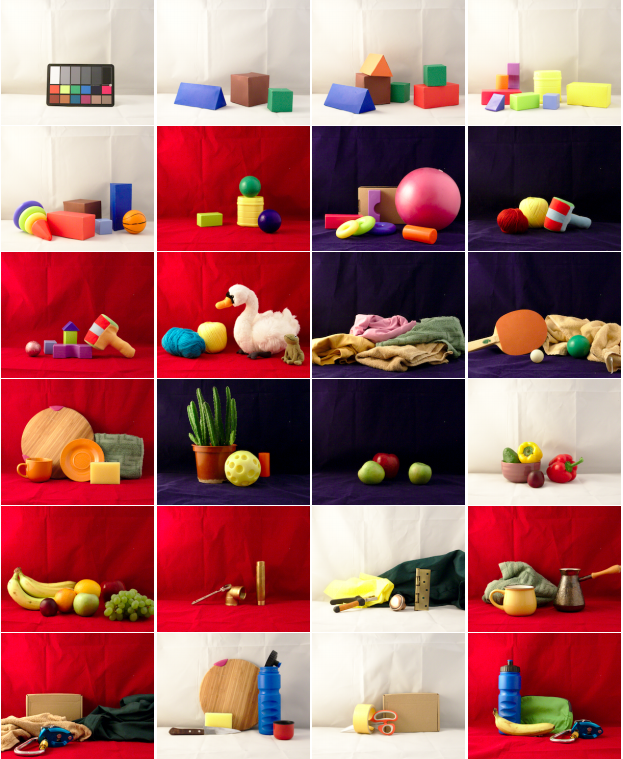

The next code section prepares the dataset. The dataset images are printed at 
the end.

In [48]:
# Transforms
normalize_transform =  tv.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
crop = tv.transforms.FiveCrop(size=IMG_SHAPE[0])
pre_norm_transform = tv.transforms.Compose([crop])
norm_transform = tv.transforms.Compose([normalize_transform])

# Data details
num_scenes = 24
ignore_scenes = {1,} # 0: the Macbeth chart
scenes = [s for s in range(1, num_scenes+1) if s not in ignore_scenes]
crops = ['topleft', 'topright', 'bottomleft', 'bottomright', 'center']
Crop = namedtuple('Crop', 'y, x, h, w')
Scene = namedtuple('Scene', 'imagenet_label, id, crop') 
# Choose a crop size that allows for 5 sub-crops of size 224.
crop_size = int(224 * 3/2) # 336 
scenes = [
    Scene('bath towel',      11, Crop(157, 264, crop_size, crop_size)),
    Scene('ping-pong ball',  12, Crop(230, 110, 263,       292)),       # Image made smaller to keep ball in all crops.
    Scene('cup',             13, Crop(157,   0, crop_size, crop_size)), # Not sure if 'cup' or 'coffee mug' is the best class.
    Scene('pot',             14, Crop(117,  50, crop_size, crop_size)), 
    Scene('Granny Smith',    15, Crop(185, 264, crop_size, crop_size)), 
    Scene('bell pepper',     5, Crop(157, 216, crop_size, crop_size)), 
    Scene('banana',          17, Crop(157,   0, crop_size, crop_size)), # This image also contains an orange and apple.
    Scene('cup',             20, Crop(197,  15, 296,       crop_size)), # Image made to keep the cup in all crops.
    Scene('water bottle',    22, Crop( 65, 264, crop_size, crop_size)), 
    Scene('water bottle',    24, Crop(20,   0, crop_size, crop_size)), # This image also contains a banana.
    Scene('banana',          24, Crop(197,  50, 296,       crop_size))] # This image also contains a water bottle.
illuminants = [
    '2HAL_DESK_LED-B025',
    '2HAL_DESK_LED-B050',
    '2HAL_DESK_LED-B075',
    '2HAL_DESK_LED-B100',
    '2HAL_DESK_LED-BG025',
    '2HAL_DESK_LED-BG050',
    '2HAL_DESK_LED-BG075',
    '2HAL_DESK_LED-BG100',
    '2HAL_DESK_LED-R025',
    '2HAL_DESK_LED-R050',
    '2HAL_DESK_LED-R075',
    '2HAL_DESK_LED-R100',
    '2HAL_DESK_LED-RG025',
    '2HAL_DESK_LED-RG050',
    '2HAL_DESK_LED-RG075',
    '2HAL_DESK_LED-RG100',
    '2HAL_DESK',
    '2HAL']


def img_key(scene_id, imagenet_label, crop_label, illuminant):
    return f'{scene_id}.{imagenet_label}.{crop_label}.{illuminant}'


def rec_2020_to_sRGB(rgb_img):
    """Convert image in REC2020 linear colorspace to an sRGB colorspace image.
    
    This method didn't actually seem to work, yet I'm not exactly sure why, so 
    I'm keeping it here so I can come back and try understand why it isn't working. 
    Below, I ended up using the inbuilt features of PIL instead.
    """
    # Rec 2020 to CIE XYZ
    to_xyz_mat = torch.tensor([[6.36953507e-01, 1.44619185e-01, 1.68855854e-01], 
                               [2.62698339e-01, 6.78008766e-01, 5.92928953e-02], 
                               [4.99407097e-17, 2.80731358e-02, 1.06082723e+00]])
    def dot_vector(m, v):
        return  torch.einsum('...ij,...j->...i', m, v)
    xyz = dot_vector(to_xyz_mat, rgb_img)
    
    # CIE XYZ to sRGB
    to_linear_rgb_mat = torch.tensor([
        [3.2406, -1.5372, -0.4986],
        [-0.9689, 1.8758, 0.0415],
        [0.0557, 0.2040, 1.057]])
    linear_rgb = dot_vector(to_linear_rgb_mat, xyz)
    
    def to_srgb(c):
        res = 12.92*c if c <= 0.0031308 else (1.055 * c**(1/2.4) - 0.055)
        return res
    s_rgb = linear_rgb.apply_(to_srgb)
    s_rgb_chw = einops.rearrange(s_rgb, 'h w c -> c h w')
    return s_rgb_chw


def open_as_srgb(img_path):
    """Open an image and convert it to sRGB.
    
    The image must have an embedded ICC color profile."""
    img = PIL.Image.open(img_path)
    icc = tempfile.mkstemp(suffix='.icc')[1]
    with open(icc, 'wb') as f:
        f.write(img.info.get('icc_profile'))
    srgb = PIL.ImageCms.createProfile('sRGB')
    img = PIL.ImageCms.profileToProfile(img, icc, srgb)
    return img

def mixed_pass(img):
    blurred0 = cv2.GaussianBlur(img,  (999, 999), 400, 400)
    blurred1 = cv2.GaussianBlur(img,  (999, 999), 30, 30)
    #blurred = np.array(blurred, dtype=np.float32)
    t0 = 0.05
    t1 =  0.9
    hp = img*t0 + (1-t0)*(img - blurred0 + 127.0)
    hp = hp*t1 + (1-t1)*(0.5*(hp + blurred1))
    hp = np.clip(hp, 0, 255.0)
    return hp

def grayworld_correct_2(img, power=6, gamma=2.2):
    """
    img (numpy array): the original image with format of (h, w, c)
    power (int): the degree of norm, 6 is used in reference paper
    gamma (float): the value of gamma correction, 2.2 is used in reference paper
    """
    img_dtype = img.dtype

    if gamma is not None:
        img = img.astype('uint8')
        look_up_table = np.ones((256, 1), dtype='uint8') * 0
        for i in range(256):
            look_up_table[i][0] = 255 * pow(i / 255, 1 / gamma)
        img = cv2.LUT(img, look_up_table)

    img = img.astype('float32')
    img_power = np.power(img, power)
    rgb_vec = np.power(np.mean(img_power, (0, 1)), 1 / power)
    rgb_norm = np.sqrt(np.sum(np.power(rgb_vec, 2.0)))
    rgb_vec = rgb_vec / rgb_norm
    rgb_vec = 1 / (rgb_vec * np.sqrt(3))
    img = np.multiply(img, rgb_vec)
    img = np.clip(img, a_min=0, a_max=255)
    return img.astype(img_dtype)

def grayworld_correct(img, strength=1.0):
    img = img.astype('uint8')
    result = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    avg_a = np.average(result[:, :, 1])
    avg_b = np.average(result[:, :, 2])
    result[:, :, 1] = result[:, :, 1] - ((avg_a - 127) * (result[:, :, 0] / 255.0) * 1.1 * strength)
    result[:, :, 2] = result[:, :, 2] - ((avg_b - 127) * (result[:, :, 0] / 255.0) * 1.1 * strength)
    result = cv2.cvtColor(result, cv2.COLOR_LAB2RGB)
    result = np.clip(result.astype('float32'), 0, 255.0) 
    return result
    
def open_img(scene, illuminant):
    """Open the image corresponding to the given scene and illuminant."""
    img_path = ds_path / 'images_preview' / f'{scene.id:02d}' / f'{scene.id:02d}_{illuminant}.jpg'
    img = open_as_srgb(img_path) 
    img = np.array(img, dtype=np.float32)
    cropped = img[scene.crop.y:scene.crop.y+scene.crop.h, scene.crop.x:scene.crop.x+scene.crop.w, :]
    return cropped


def create_dataset(filter=False):
    """
    Dataset as a dict. Keys are of the form: 04-topleft-2HAL_DESK_LED-B025.
    Images are 0-1 tensors.
    """
    images = dict()
    for s in scenes:
        for ill in illuminants:
            img = open_img(s, ill)
            #img = np.asarray(img, dtype=np.float32) / 255.0
            img = np.asarray(img, dtype=np.float32)
            #img = high_pass_filter(img)
            if filter:
                img = mixed_pass(img)
                #img = grayworld_correct(img, strength=1.0)
            img = img / 255.0
            img = torch.tensor(einops.rearrange(img, 'h w c -> c h w'))
            cropped_images = pre_norm_transform(img)
            for crop_label, ci in zip(crops, cropped_images):
                images[img_key(s.id, s.imagenet_label, crop_label, ill)] = ci
    return images

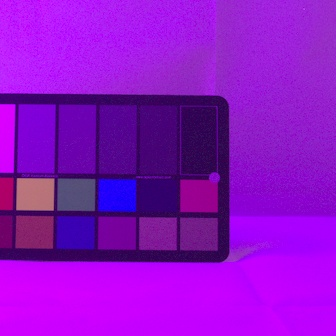

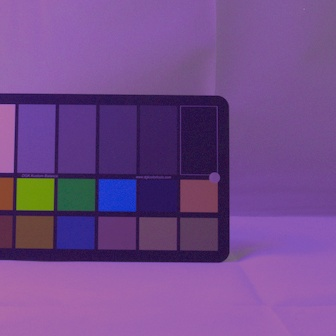

In [49]:
img = open_img(scene=scenes[5], illuminant=illuminants[3])
imshow(img/255.0)
def gwc(img):
    img = img.astype('uint8')
    result = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    avg_a = np.average(result[:, :, 1])
    avg_b = np.average(result[:, :, 2])
    result[:, :, 1] = result[:, :, 1] - ((avg_a - 127) * (result[:, :, 0] / 255.0) * 1.8)
    result[:, :, 2] = result[:, :, 2] - ((avg_b - 127) * (result[:, :, 0] / 255.0) * 1.8)
    result = cv2.cvtColor(result, cv2.COLOR_LAB2RGB)
    result = np.clip(result.astype('float32'), 0, 255.0)
    return result
imshow(grayworld_correct(img, strength=1.3)/255.0)

In [52]:
def get_ds_image(ds, scene, illuminant, subcrop):
    # img is torch in CxHxW format.
    img = ds[img_key(scene.id, scene.imagenet_label, subcrop, illuminant)]
    img = einops.rearrange(img, 'c h w -> h w c').numpy()
    return img


def print_originals():
    """Print the images before the 5-crop transformation.
    
    Only images for one illumination are printed."""
    images = []
    labels = []
    for s in scenes:
        img = open_img(s, illuminants[-2])
        labels.append(s.imagenet_label)
        images.append(img)
    imlist(images, labels)
            
def print_single_illuminant(illuminant = '2HAL_DESK_LED-RG075'):
    """Print images for 1 illuminant before 5-crop, using matplotlib."""
    fig = plt.figure(figsize=(12, 11))
    num_scenes = len(scenes)
    cols = 4
    rows = math.ceil(num_scenes / cols)
    for idx, s in enumerate(scenes):
        ax = fig.add_subplot(rows, cols, idx+1)
        ax.set_axis_off()
        ax.set_anchor('N')
        ax.set_title(f'{idx}: {s.imagenet_label.lower()}', loc='center')
        ax.imshow(open_img(s, illuminant)/255)
    fig.subplots_adjust(hspace=0.0, wspace=0.1)
    plt.savefig("./out/report/mls_all_scenes.pdf", format="pdf", bbox_inches="tight")
    fig.show()
    
def print_single_scene(scene_idx=5):
    """Print images for 1 scene before 5-crop, using matplotlib."""
    fig = plt.figure(figsize=(20, 10))
    num_illum = len(illuminants)
    cols = 6
    rows = math.ceil(num_illum / cols)
    for idx, ill in enumerate(illuminants):
        ax = fig.add_subplot(rows, cols, idx+1)
        ax.set_axis_off()
        ax.imshow(open_img(scenes[scene_idx], ill)/255)
    fig.subplots_adjust(hspace=0.05, wspace=0.02)
    fig.show()
        
def print_single_scene2(scene_idx=5):
    """Print images for 1 scene before 5-crop, using matplotlib."""
    fig = plt.figure(figsize=(12, 20))
    num_illum = len(illuminants)
    cols = 3
    rows = math.ceil(num_illum / cols)
    for idx, ill in enumerate(illuminants):
        ax = fig.add_subplot(rows, cols, idx+1)
        ax.set_axis_off()
        ax.set_title(re.sub('_', '-', ill), loc='center', fontsize=18)
        ax.imshow(open_img(scenes[scene_idx], ill)/255)
    fig.subplots_adjust(hspace=0.3, wspace=0.05)
    plt.savefig("./out/report/mls_all_illuminants_details.pdf", format="pdf", bbox_inches="tight")
    fig.show()
    
def print_correction_comparison():
    """Print images for 1 illuminant before 5-crop, using matplotlib."""
    fig = plt.figure(figsize=(20, 7))
    cols = 6
    rows = 2
    s = scenes[5]
    for i in range(cols):
        ax_top = fig.add_subplot(rows, cols, i+1)
        ax_bottom = fig.add_subplot(rows, cols, i+cols+1)
        ax_top.set_axis_off()
        ax_bottom.set_axis_off()
        ax_top.imshow(open_img(s, illuminants[i*2])/255)
        ax_bottom.imshow(grayworld_correct(open_img(s, illuminants[i*2]), strength=1.5)/255)
    fig.subplots_adjust(hspace=0.00, wspace=0.10)
    plt.savefig("./out/report/mls_grayworld_comparison.pdf", format="pdf", bbox_inches="tight")

def print_dataset(ds, inc_illuminants=None):
    """Print the dataset images.
    
    Args:
        inc_illuminants (set): restrict the illuminants to this set. Without
                               setting this option, the number of images printed
                               with be quite large (11x5x18).
   """
    if not inc_illuminants:
        inc_illuminants = set(illuminants)
    tab_labels = []
    images = []
    custom_labels = []
    for k,v in ds.items():
        sid, imagenet_label, crop, illuminant = k.split('.')
        if not illuminant in inc_illuminants:
            continue
        tab_labels.append(illuminant)
        images.append(einops.rearrange(v.numpy(), 'c h w -> h w c'))
        custom_labels.append(f'{imagenet_label} ({crop})')
        
    ipyplot.plot_class_tabs(images, tab_labels, custom_labels, max_imgs_per_tab=200)

The following images are the hand-chosen 11 different 336x366 crops, under 2HAL illumination (two halogen lights).

One aspect of the dataset that is worth pointing out is that they use a naming convention for their
illuminants, so 2HAL means 2 halogen lights, DESK means a tungsten desk lamp, LED-B025 means a blue LED light
at 25% power. Check the dataset source for more details.

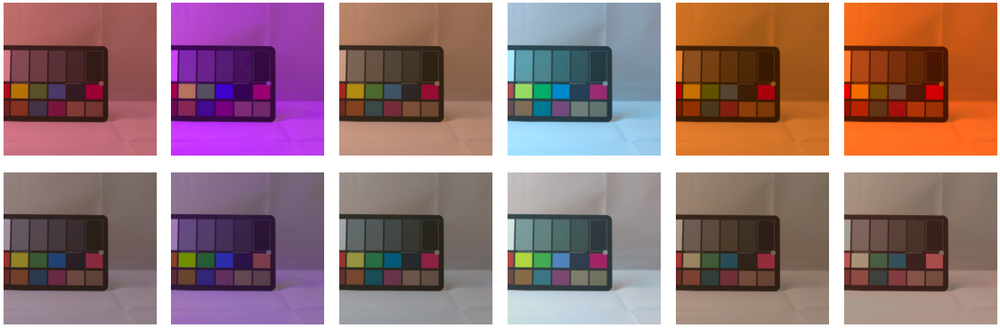

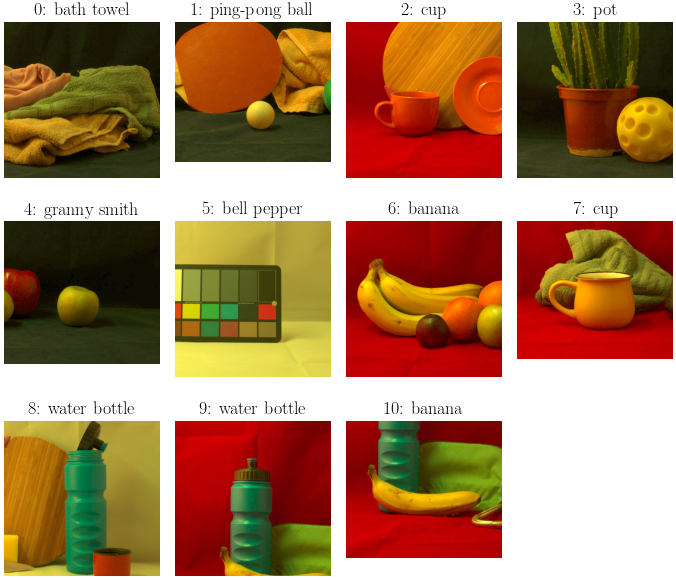

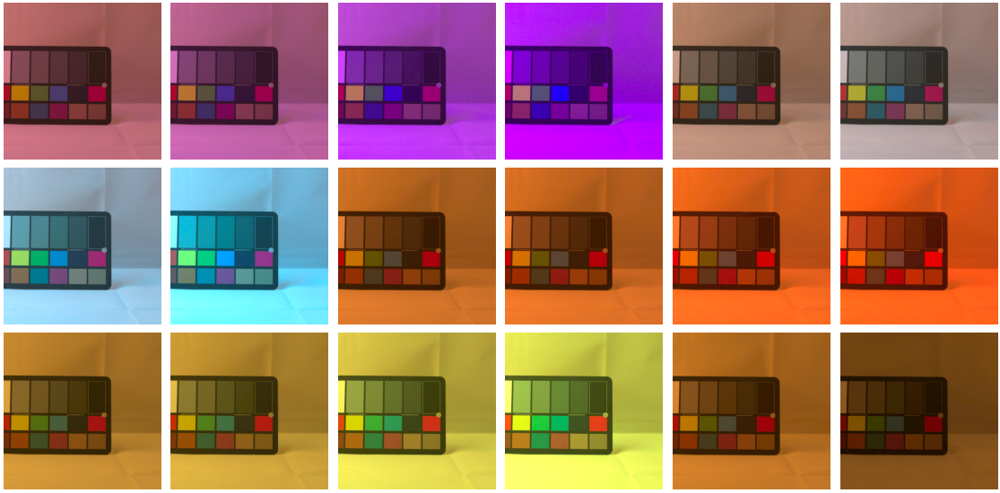

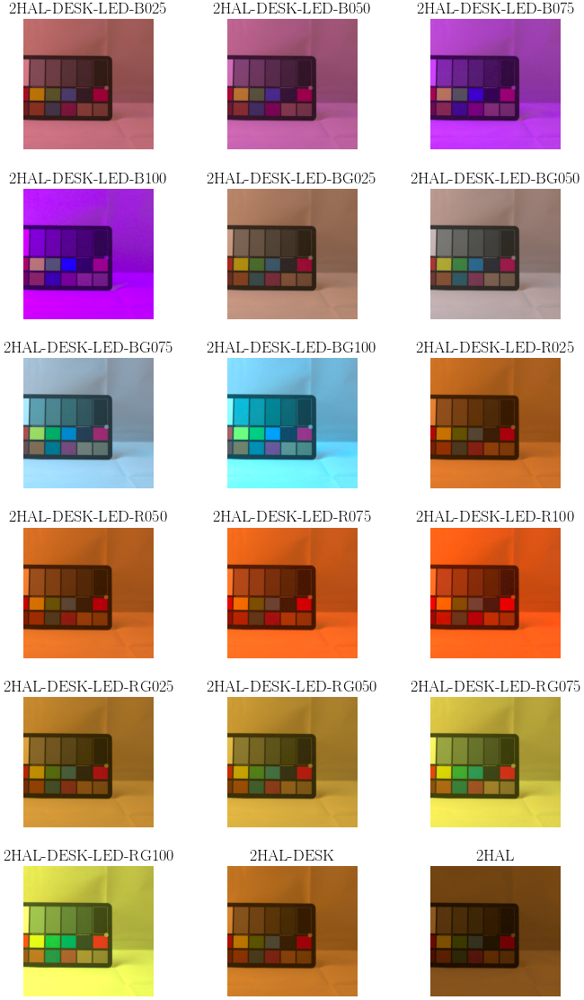

In [51]:
def _p():
    print_correction_comparison()
    print_single_illuminant()
    print_single_scene(scene_idx=5)
    print_single_scene2(scene_idx=5)
_p()

Below, is a subset of the whole dataset. The 11 336x336 are cropped into 5 different 224x224 images, and this is done for all 18 illuminations. Below, only 3 out of the 18 illuminations are shown.

## 2. Method
Same as experiment 2.0.0. 

Pass each of the 11x18x5 (11 scenes, 18 illuminations, 5 crops) preview images
into a ResNet model for classification. The ResNet model is pretrained for 
ImageNet classification. Record every classification. 

In [29]:
def run_all_images_through_ResNet(ds):
    """Input the images into the ResNet model and collect results.
    
    Returns: results as an xarray.DataArray.
    """
    raw_data = np.zeros((len(scenes), len(crops), len(illuminants), NUM_CLASSES))
    classification_val_id_pairs = []
    for idx, s in enumerate(scenes): 
        for crop_idx, crop in enumerate(crops):
            classification_ids = []
            for ill_idx, ill in enumerate(illuminants):
                img = ds[img_key(s.id, s.imagenet_label, crop, ill)]
                input_ = torch.unsqueeze(normalize_transform(img), 0).to(device)
                model_out = model.forward(input_)
                raw_data[idx][crop_idx][ill_idx][:] = model_out.squeeze().detach().cpu()
    xdata = xr.DataArray(raw_data,  
                         coords={'scene':range(len(scenes)), 'crop':crops,  'illuminant':illuminants, 
                                 'class_id':np.arange(0, NUM_CLASSES)})
    return xdata
ds_mod =  create_dataset(filter=True)
ds_orig =  create_dataset(filter=False)
data_orig = run_all_images_through_ResNet(ds_orig)
data_mod = run_all_images_through_ResNet(ds_mod)

In [30]:
#print_dataset(ds_mod, {'2HAL_DESK_LED-B100', '2HAL'})
#print_single_illuminant('2HAL_DESK_LED-B100')

## 3. Inspect data, part 1. Some figures.
The data is inspected to see how illumination effects the ResNet outputs.

The data s a 4 dimensional table of floats. Each 1000 floats grouped into the
last dimension "class_id" collectively represent the 1000 outputs of ResNet for
a single input image. The following summary from xarray shows some more 
details:

In [31]:
data_orig

<xarray.DataArray (scene: 11, crop: 5, illuminant: 18, class_id: 1000)>
array([[[[-8.26559901e-01,  6.86286390e-01, -2.82894194e-01, ...,
          -1.27754688e+00, -4.53720093e-01,  2.46036363e+00],
         [-2.54348218e-01,  1.12813318e+00,  2.23269165e-01, ...,
          -6.36900425e-01, -2.76042879e-01,  2.53209352e+00],
         [-3.35065782e-01,  1.94555092e+00, -9.44116153e-03, ...,
          -9.37242866e-01,  5.83484396e-02,  2.08711052e+00],
         ...,
         [-1.33792436e+00, -4.49194580e-01, -1.25488532e+00, ...,
          -1.06339669e+00,  2.86589170e+00,  2.42612076e+00],
         [-2.42479467e+00,  3.61435652e-01, -7.32229650e-01, ...,
          -2.35019755e+00,  1.46899492e-01,  2.89066362e+00],
         [-1.74683261e+00,  8.94255698e-01, -1.33621514e-01, ...,
          -2.71151114e+00, -3.39940310e-01,  4.24233389e+00]],

        [[-1.09654379e+00,  2.09361445e-02,  1.18834019e+00, ...,
          -1.23265195e+00, -9.95528460e-01,  3.85334945e+00],
         [ 6.06559873e-01,  9.56440151e-01,  1.92365742e+00, ...,
          -3.21466893e-01, -3.58290315e-01,  2.33799338e+00],
         [ 1.17482030e+00,  2.57543635e+00,  1.72596145e+00, ...,
          -3.09771597e-01, -3.32471803e-02,  2.52212620e+00],
...
         [-3.61528635e-01, -1.75639898e-01,  3.57608944e-01, ...,
           2.48562407e+00,  6.50312483e-01,  3.37359858e+00],
         [ 2.03206658e-01,  4.27312478e-02, -1.11047637e+00, ...,
           5.17476845e+00,  1.23582399e+00,  2.22449493e+00],
         [ 1.79287589e+00,  1.57848909e-01, -1.03675199e+00, ...,
           6.24741936e+00,  1.24203563e+00,  1.03109586e+00]],

        [[ 1.45165968e+00,  3.42715502e+00, -1.43797398e+00, ...,
           2.91796851e+00,  1.49433768e+00,  1.25519836e+00],
         [-7.63919115e-01,  1.81057894e+00, -1.03001857e+00, ...,
           1.78686142e+00,  3.86600345e-01,  1.80080485e+00],
         [-1.90745521e+00,  1.35258114e+00, -8.11632037e-01, ...,
           1.99530923e+00, -8.62653852e-01,  3.22625351e+00],
         ...,
         [ 1.60213605e-01,  1.48106110e+00, -7.62014270e-01, ...,
           2.11439991e+00,  2.39115310e+00,  1.76518643e+00],
         [ 6.95660412e-01,  2.37675905e+00, -1.94918633e+00, ...,
           2.84961820e+00,  1.89502800e+00,  6.29991412e-01],
         [ 7.07340181e-01,  5.03104210e-01, -1.22423744e+00, ...,
           4.05306292e+00,  1.24074221e+00,  4.55264837e-01]]]])
Coordinates:
  * scene       (scene) int64 0 1 2 3 4 5 6 7 8 9 10
  * crop        (crop) <U11 'topleft' 'topright' ... 'bottomright' 'center'
  * illuminant  (illuminant) <U19 '2HAL_DESK_LED-B025' ... '2HAL'
  * class_id    (class_id) int64 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999

In [32]:
# Organise the data into some useful formats. 
# These results are used throughout the rest of the notebook. 
#
def is_equal_groundtruth(d):
    classifications = d.argmax(dim='class_id')
    res = []
    for idx, group in classifications.groupby('scene'):
        res.append(xr.where(group == label_to_class_id(scenes[idx].imagenet_label), True, False))
    res = xr.concat(res, dim='scene')
    return res

### Classification accuracy vs. illuminants
Below is a 2D table showing whether ResNet correctly labeled an image. Green
represents a correct classification, and black represents an incorrect 
classification. Illuminants vary over the y-axis and both scenes and crop vary 
over the x-axis.

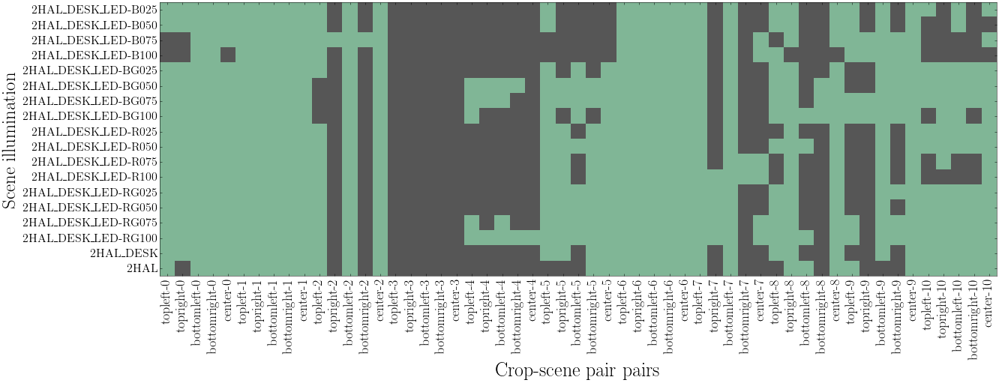

In [33]:
green = '#80b696'
gray = '#565656'
blue = '#80A6B6'
def plot_by_illuminant(data, condense=False):
    results = is_equal_groundtruth(data).stack(scene_crop=('scene', 'crop'))
    if condense:
        by_scene_crop = results.groupby('scene_crop')#, squeeze=True)
        non_zero = []
        for _,g in by_scene_crop:
            if g.any() and not g.all():
                non_zero.append(g)
        results = xr.concat(non_zero, dim='scene_crop')
        xlabel_fontsize = 30
        ylabel_fontsize = 20
    else:
        xlabel_fontsize = 18
        ylabel_fontsize = 16
    y_ticks = results.illuminant.data
    if latex_mode:
        y_ticks = [re.sub('_', '\_', s) for s in y_ticks]
    x_ticks = [f'{c}-{s}' for (s,c) in results.scene_crop.data]
    fig, ax = plt.subplots(figsize=(20,20))
    #ax.set_title(f'{model_name_str()} Classification (correct/incorrect) for illumination vs. crop-scene pair', fontsize=30, pad=15)
    ax.set_ylabel('Scene illumination', fontsize=25)
    ax.set_xlabel('Crop-scene pair pairs', fontsize=26)
    ax.minorticks_off()
    ax.set_xticks(np.arange(results.shape[1]))
    ax.set_yticks(np.arange(results.shape[0]))
    plt.setp(ax.get_xticklabels(), rotation=90, ha='right', rotation_mode='anchor')
    ax.set_xticklabels(x_ticks, fontsize=xlabel_fontsize, fontdict={'verticalalignment':'center'})
    ax.set_yticklabels(y_ticks, fontsize=ylabel_fontsize)
    cmap = mpl.colors.ListedColormap([gray, green])
    ax.imshow(results, cmap=cmap)
    filename = 'mls_results_min' if condense else 'mls_results_full'
    plt.savefig(f"./out/report/{filename}.pdf", format="pdf", bbox_inches="tight")
    fig.show()
plot_by_illuminant(data_orig, condense=False)

The 2D table is repeated again below, this time, empty columns are removed. 
Empty columns represent scene-crop pairs that were labeled identically under
every illumination. When investigating effects of illumination, it may be 
interesting to ignore these cases.

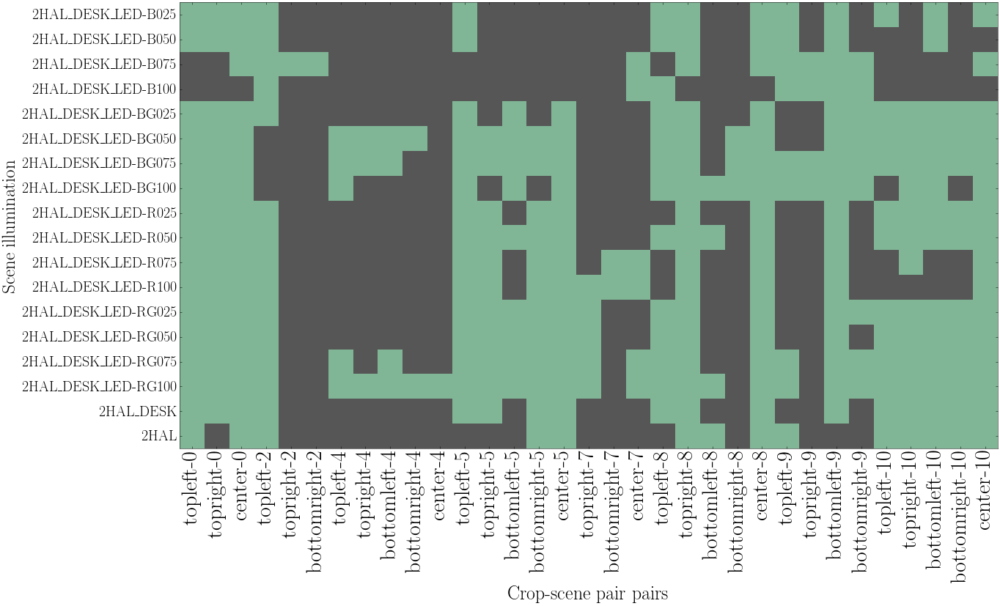

In [34]:
plot_by_illuminant(data_orig, condense=True)

### Effect of illuminants
The above figure is transformed by summing along the x-axis 
(scene-crop axis disappears). The illumination axis stays the same. The x-axis
becomes a count.
Below is a figure with the number of successful classifications summed across scenes and crops, then plotted against illumination. From this we see that actually, there _is_ quite a difference between the different illuminants. The cube above is thus not a great visualization.

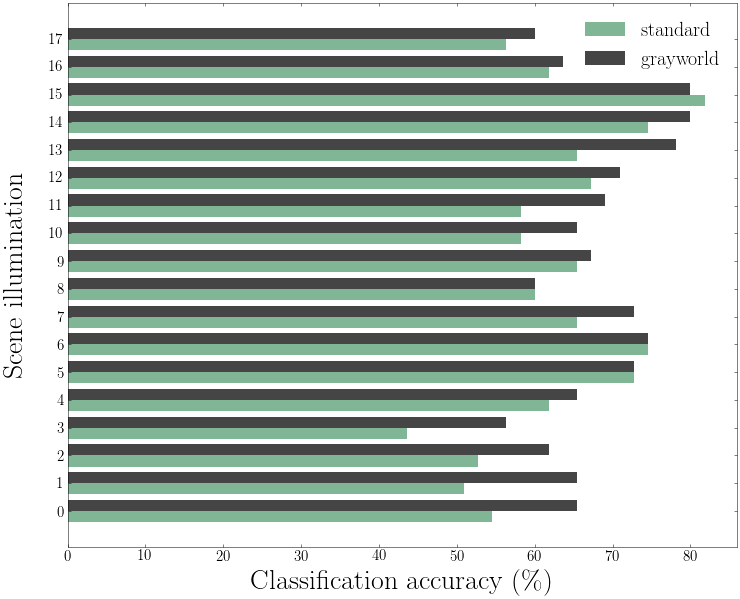

In [57]:
def plot_accuracy_scatter(res_by_illuminant):
    num_per_illuminant = 55
    num_illuminants = 18
    axis_label_font_size = 20
    accuracy = res_by_illuminant.data / num_per_illuminant * 100
    print(accuracy)
    fig, ax = plt.subplots(figsize=(12,4))
    ax.set_xlabel('Classification accuracy (\%)', fontsize=axis_label_font_size)
    ax.set_xlim(40, 86)
    y = np.ones(num_illuminants)
    x = np.sort(accuracy)
    diff = np.diff(x)
    dist = np.hstack([diff, np.median(diff)])
    #y = 0.1 + np.log(dist)
    y = 1/(dist + 1000)
    print(y)
    y = (y - np.min(y)) / (np.max(y) - np.min(y))
    #y = y[0] + 0.5*(y - 0.5)
    plt.scatter(x, y)
    plt.show()
    
    
def plot_accuracy_by_illuminant(res_by_illuminant1, res_by_illuminant2=None):
    #ans.plot()
    fig, ax = plt.subplots(figsize=(12,10))
    #ax.set_title(f'Correct classification counts for {model_name_str()} under different illumination')
    axis_label_font_size = 28
    ax.set_ylabel('Scene illumination', fontsize=axis_label_font_size, labelpad=21)
    ax.set_xlabel('Classification accuracy (\%)', fontsize=axis_label_font_size)
    ax.set_yticks(np.arange(0, len(illuminants)))
    ax.set_xlim(0, 86)
    ax.minorticks_off()
    y_tick_labels = illuminants
    num_per_illuminant = 55
    if latex_mode:
        y_tick_labels = (re.sub('_', '\_', s) for s in y_tick_labels)
    #ax.set_yticklabels(y_tick_labels)#, fontsize=20)
    if res_by_illuminant2 is None:
        accuracy = res_by_illuminant1.data / num_per_illuminant * 100
        ax.barh(np.arange(len(illuminants)), accuracy, color=green)
    else:
        width = 0.40
        gap = 0.1
        accuracy1 = res_by_illuminant1.data / num_per_illuminant * 100
        ax.barh(np.arange(len(illuminants)) - width/2, accuracy1, width, color=green, label='standard')
        accuracy2 = res_by_illuminant2.data / num_per_illuminant * 100
        blue = '#006D9B'
        blue = '#454545'
        ax.barh(np.arange(len(illuminants)) + width/2, accuracy2, width, color=blue, label='grayworld')
        ax.legend(fontsize=20)
    plt.savefig(f"./out/report/mls_accuracy_resnet50_noylabels.pdf", format="pdf", bbox_inches="tight")
    fig.show()
by_illuminant_orig = is_equal_groundtruth(data_orig).sum(dim=['scene', 'crop'])
by_illuminant_mod = is_equal_groundtruth(data_mod).sum(dim=['scene', 'crop'])
#plot_accuracy_by_illuminant(by_illuminant_orig, by_illuminant_mod)
#plot_accuracy_scatter(by_illuminant_orig)#, by_illuminant_mod)
plot_accuracy_by_illuminant(by_illuminant_orig, by_illuminant_mod)

## 3. Inspect data, part 2. Good illumination, bad illumination.
The above figures make it clear that illumination has an effect on 
classification accuracy. To get a better feel for the details of this effect, 
this section compares the best and worst illuminants. 

On average, the best illumination was the illumination where both the red and 
green LED lights were enabled and set at 75% power.

The worst illumination occurred with the LED set to blue only, at 100% power.
The next two worst illuminations were the same except for the LED power set to 
75% and 50%. The blue only LED setup at 25% power managed to just eclipse the 
blue-green LED setup at 100% power.

In both of these scenes there was also 2 halogen lights and 1 desktop lamps.

### Best was red-green, worst was blue.

Best illuminant: 2HAL_DESK_LED-RG075
Worst illuminant: 2HAL_DESK_LED-B100


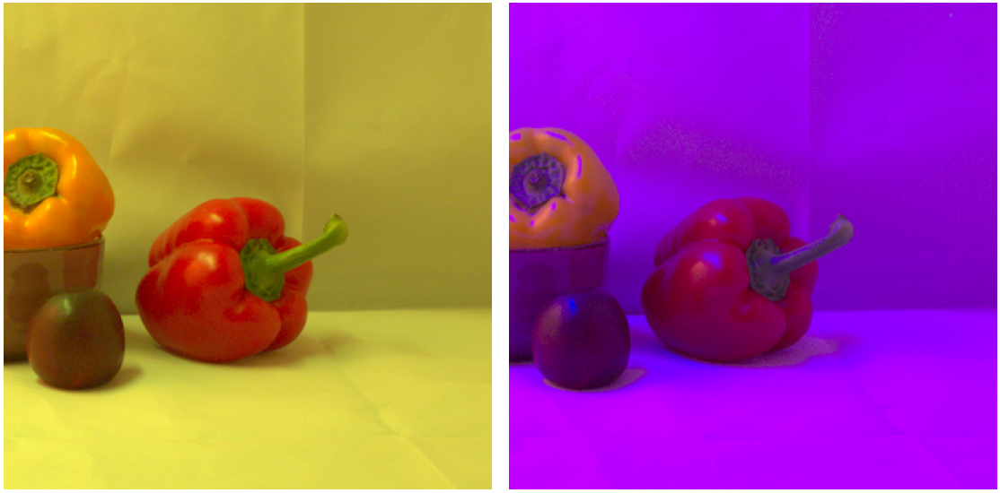

In [36]:
worst_illum, best_illum = illuminants[3], illuminants[14]
print(f'Best illuminant: {best_illum}')
print(f'Worst illuminant: {worst_illum}')
def print_best_and_worst(scene_idx=5):
    fig = plt.figure(figsize=(20, 10))
    cols = 2
    rows = 1
    for idx in range(2):
        ax = fig.add_subplot(rows, cols, idx + 1)
        ax.set_axis_off()
        #ax.set_title(['Best illuminant', 'Worse illuminant'][idx], fontsize=30)
        ax.imshow(open_img(scenes[scene_idx], [best_illum, worst_illum][idx])/255)
    fig.subplots_adjust(hspace=0.05, wspace=0.02)
    fig.show()
print_best_and_worst(scene_idx=5)

It might be useful to refer to the dataset printout shown towards the top
of the page; both of these illuminants were included as tabs.

### Inspect the best and worst illumination
Below we inspect the classifications for the two illuminations by dividing 
all scene-crop pairs into the 4 tabs depending on whether the image was
correctly or incorrectly labeled. For each tab, images come in pairs: best 
illumination followed by worst illumination. 

Interestingly, there are actually only 3 tabs, as there were no images for 
which ResNet failed under the good illumination but succeeded under the bad 
illumination.



(0, center)
(4, topleft)
(5, topleft)
(7, topright)
(8, topright)
(10, bottomleft)


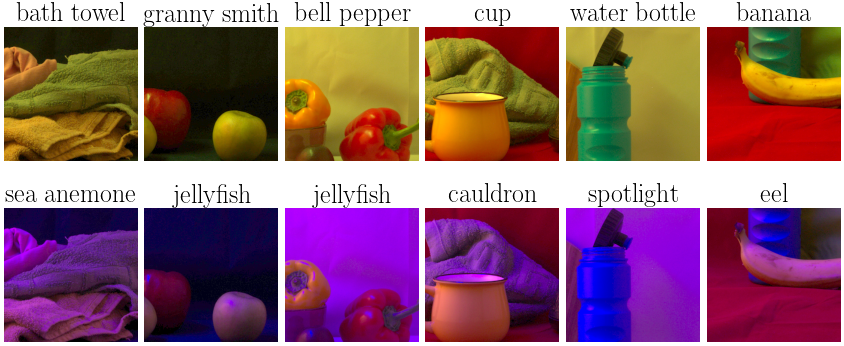

In [37]:
def best_worst_demo(ds, data):
    results = is_equal_groundtruth(data)
    classifications = data.argmax(dim='class_id')
    good_imgs = []
    good_labels = []
    bad_imgs = []
    bad_labels = []
    skip = {(10, 'topleft'), (0, 'topleft'), (0, 'topright'), (10, 'topright')}
    for s in results.scene:
        crop_done = False
        for c in results.crop[0:]:
            if crop_done:
                break
            if (int(s.data), str(c.data)) in skip:
                continue
            res_best_illum = results.sel(scene=s, crop=c, illuminant=best_illum)
            res_worst_illum = results.sel(scene=s, crop=c, illuminant=worst_illum)
            label = None
            if res_best_illum and not res_worst_illum:
                print(f'({s.data}, {c.data})')
                good_imgs.append(get_ds_image(ds, scenes[s.data], best_illum, c.data))
                bad_imgs.append(get_ds_image(ds, scenes[s.data], worst_illum, c.data))
                good_labels.append(class_id_to_label(classifications.sel(scene=s, crop=c, illuminant=best_illum)))
                bad_labels.append(class_id_to_label(classifications.sel(scene=s, crop=c, illuminant=worst_illum)))
                crop_done = True
    
    # Print images
    fig = plt.figure(figsize=(15, 6))
    cols = 6
    rows = 2
    for i in range(cols):
        axg = fig.add_subplot(rows, cols, i+1)
        axb = fig.add_subplot(rows, cols, i+1+6)
        axg.set_axis_off()
        axb.set_axis_off()
        axg.set_title(good_labels[i].lower(), loc='center', fontsize=26)
        axb.set_title(bad_labels[i].lower(), loc='center', fontsize=26)
        axg.imshow(good_imgs[i])
        axb.imshow(bad_imgs[i])
    fig.subplots_adjust(hspace=0.25, wspace=0.05)
    fig.show()
    plt.savefig("./out/report/mls_best_worst_list_big_font.pdf", format="pdf", bbox_inches="tight")
best_worst_demo(ds_orig, data_orig) 


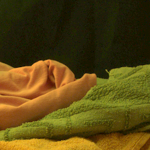
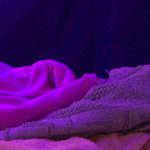
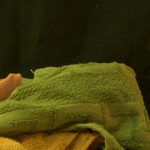
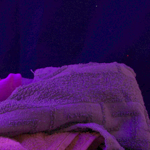
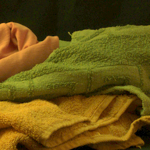
...
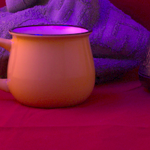
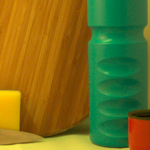
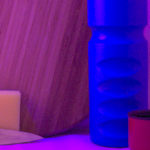
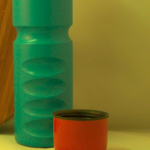
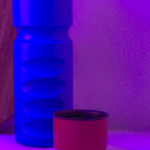

In [38]:
def compare_classifications(ds, data):
    classifications = data.argmax(dim='class_id')
    images = []
    tab_labels = []
    class_labels = []
    results = is_equal_groundtruth(data)

    for s in results.scene:
        for c in results.crop:
            res_best_illum = results.sel(scene=s, crop=c, illuminant=best_illum)
            res_worst_illum = results.sel(scene=s, crop=c, illuminant=worst_illum)
            label = None
            if res_best_illum:
                if res_worst_illum:
                    label = 'both correct'
                else:    
                    label = 'best illum correct, worst illum incorrect'
            else:
                if res_worst_illum:
                    label = 'best illum incorrect, worst illum correct'
                else:
                    label = 'both incorrect'
            #images.append(open_img(scenes[s.data], best_illum))
            images.append(get_ds_image(ds, scenes[s.data], best_illum, c.data))
            images.append(get_ds_image(ds, scenes[s.data], worst_illum, c.data))
            class_labels.append(class_id_to_label(classifications.sel(scene=s, crop=c, illuminant=best_illum)))
            class_labels.append(class_id_to_label(classifications.sel(scene=s, crop=c, illuminant=worst_illum)))
            tab_labels.append(label)
            tab_labels.append(label)
    ipyplot.plot_class_tabs(images, tab_labels, class_labels)
compare_classifications(ds_orig, data_orig)            

## 4. Discussion
Below are the two correct classification tallies for experiment 2.0.1 and experiment 2.1.1. 

Experiment 2.0.1:

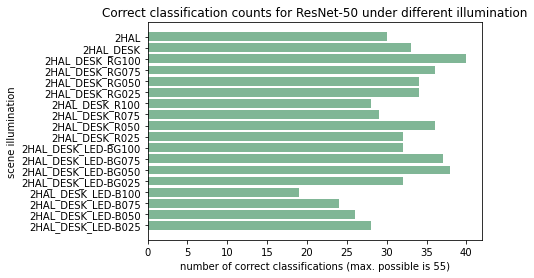


Experiment 2.1.1:

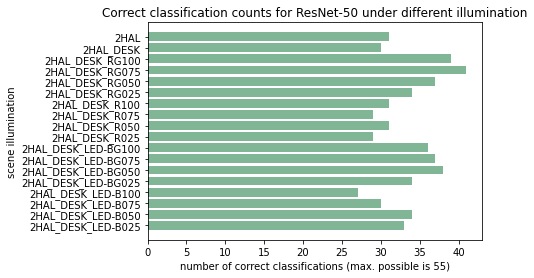

The scenes whose illumination led to poor results in experiment 2.0.1 experience much better classification accuracy in this experiment when the images are passed through the high-pass filter. The scenes which experienced good results in experiment 2.0.1 did not experience much better results in this experiment. Thus, it seems as though the basic high pass filter is helping to improve classification accuracy for scenes whose illumination is negatively effecting classification. 

There are still differences between the illuminants; however, so there is room for improvement. The filter used in this experiment was very basic, so investigating alternatives is an interesting direction. 